<a href="https://colab.research.google.com/github/bonardolubis/MachineLearningTasks/blob/main/EndTermTask.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tugas Akhir Komputasi Intelegensia - Kelas Pak Risman Adnan

Nama : Bonardo Lubis

NPM  : 2006568784

# Data Gambar Menggunakan Convolutional Neural Networks (CNN)

## Data Acquisition

References:
- https://www.kaggle.com/datasets/alessiocorrado99/animals10

In [ ]:
import os
os.environ['KAGGLE_USERNAME'] = "bonardolubis"
os.environ['KAGGLE_KEY'] = "83120e3e82746988e1019eb9704af134"

In [ ]:
!pip install --upgrade --force-reinstall --no-deps kaggle

from google.colab import output
output.clear()

In [ ]:
!mkdir "/content/drive/MyDrive/Data Gambar/Animals10/datasets"

mkdir: cannot create directory ‘/content/drive/MyDrive/Data Gambar/Animals10/datasets’: File exists


In [ ]:
DATA_DIR = "/content/drive/MyDrive/Data Gambar/Animals10/datasets"

#### Animals10 Dataset

In [ ]:
!kaggle datasets download alessiocorrado99/animals10 -p "/content/drive/MyDrive/Data Gambar/Animals10/datasets"
# !kaggle datasets download alessiocorrado99/animals10 -p "$DATA_DIR"

Dataset URL: https://www.kaggle.com/datasets/alessiocorrado99/animals10
License(s): GPL-2.0
animals10.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
file_to_unzip = DATA_DIR + '/animals10.zip'
!echo "Unzipping: $file_to_unzip"
!unzip -q "$file_to_unzip" -d '/content/datasets/'
# !rm "$file_to_unzip"

Unzipping: /content/drive/MyDrive/Data Gambar/Animals10/datasets/animals10.zip


## Inspect Images

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

import random

In [ ]:
DATA_DIR = "/content/datasets/raw-img"
CLASSES = os.listdir(DATA_DIR)
print(len(CLASSES), CLASSES, )

10 ['cavallo', 'gatto', 'farfalla', 'gallina', 'ragno', 'mucca', 'cane', 'elefante', 'scoiattolo', 'pecora']


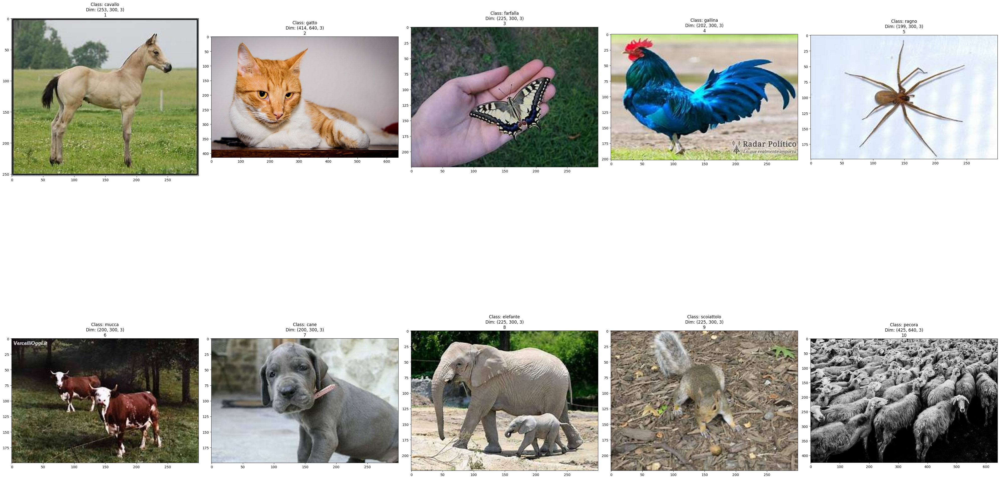

In [ ]:
fig = plt.figure(figsize=(40, 30))

# plt.suptitle("Random Images of Each Classes")
for idx, kelas in enumerate(CLASSES, 1):
    image_folder_path = os.path.join(DATA_DIR, kelas)
    random_image = random.choice(os.listdir(image_folder_path))
    image_path = os.path.join(image_folder_path, random_image)
    img = cv2.imread(image_path) # numpy
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(2, 5, idx)
    # plt.title("Image: {}\nClass: {}\nDim: {}".format(random_image, kelas, img.shape))
    plt.title("Class: {}\nDim: {}\n{}".format(kelas, img.shape, idx))
    plt.imshow(img)

plt.tight_layout()
plt.show()

In [ ]:
# Since the images consist of various image height and weight sizes, check the minimum values

min_image_height = 9999
min_image_width = 9999

max_image_height = 0
max_image_width = 0

for idx, kelas in enumerate(CLASSES, 1):
    image_folder_path = os.path.join(DATA_DIR, kelas)
    for image in os.listdir(image_folder_path):
        image_path = os.path.join(image_folder_path, image)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_h, img_w = img.shape[0], img.shape[1]
        # check the smallest values
        if img_h < min_image_height:
            min_image_height = img_h
            smallest_image_height = image_path.split("/")[-2:]
        if img_w < min_image_width:
            min_image_width = img_w
            smallest_image_width = image_path.split("/")[-2:]
        # check the highest values
        if img_h > max_image_height:
            max_image_height = img_h
            highest_image_height = image_path.split("/")[-2:]
        if img_w > max_image_width:
            max_image_width = img_w
            highest_image_width = image_path.split("/")[-2:]

print("{} have the smallest image height: {}".format(smallest_image_height, min_image_height))
print("{} have the smallest image width: {}".format(smallest_image_width, min_image_width))
print("{} have the highest image height: {}".format(highest_image_height, max_image_height))
print("{} have the highest image width: {}".format(highest_image_width, max_image_width))

['cavallo', 'OIP-bT32YLeLizQNLnu4lcVGAAAAAA.jpeg'] have the smallest image height: 57
['cavallo', 'OIP-bT32YLeLizQNLnu4lcVGAAAAAA.jpeg'] have the smallest image width: 60
['gatto', 'jose-ros-photo-388605-unsplash.jpg'] have the highest image height: 6000
['gatto', 'max-boettinger-486490-unsplash.jpg'] have the highest image width: 6720


## Data Preparation

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
for kelas in os.listdir("/content/datasets/raw-img"):
    kelas_path = os.path.join(DATA_DIR, kelas)
    kelas_files = os.listdir(kelas_path)
    train_files, test_files = train_test_split(kelas_files, test_size=0.3)

    # create train directory
    train_dir = os.path.join(DATA_DIR, "train", kelas)
    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    for filename in train_files:
        # Ref: https://stackoverflow.com/questions/8858008/how-do-i-move-a-file-in-python
        os.replace(os.path.join(kelas_path, filename), os.path.join(train_dir, filename))

    # create test directory
    test_dir = os.path.join(DATA_DIR, "test", kelas)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)
    for filename in test_files:
        os.replace(os.path.join(kelas_path, filename), os.path.join(test_dir, filename))

In [ ]:
# !rm -rf "/content/datasets/raw-img/train/"
# !rm -rf "/content/datasets/raw-img/test/"

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# Define data directories
train_data_dir = '/content/datasets/raw-img/train'
validation_data_dir = '/content/datasets/raw-img/test'

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

validation_datagen = ImageDataGenerator(rescale=1.0/255)

validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    # shuffle=False  # NO NEED I GUESS
)

Found 18322 images belonging to 10 classes.
Found 7857 images belonging to 10 classes.


## Hyperparameter Setting

In [ ]:
# Parameters
INPUT_SHAPE = (224, 224, 3)  # Adjust the input shape based on your image dimensions
BATCH_SIZE = 32
EPOCHS = 10

## Convolutional Neural Network

### Model Definition

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Activation, Dropout, Flatten, Dense

In [ ]:
def build_model(input_shape, num_classes=4):
    model = Sequential()
    model.add(tf.keras.Input(shape=input_shape))
    model.add(Conv2D(32, kernel_size=(3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, kernel_size=(3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, kernel_size=(3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(256, kernel_size=(3, 3)))
    model.add(Activation('relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(128, use_bias=True, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(num_classes))
    model.add(Activation('softmax'))

    # Compile the model
    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=['accuracy', tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
    )
    return model

In [ ]:
model = build_model(input_shape=INPUT_SHAPE, num_classes=len(CLASSES))

In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 222, 222, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 109, 109, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 52, 52, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 24, 24, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 24, 24, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 36864)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       4,718,720 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 5,108,426 (19.49 MB)

 Trainable params: 5,108,426 (19.49 MB)

 Non-trainable params: 0 (0.00 B)

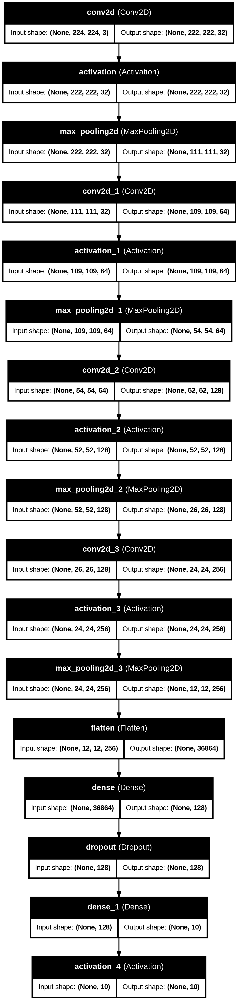

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    # dpi=200,
    show_layer_activations=False,
    show_trainable=False,
)

### Fitting

In [ ]:
# Train the model
hist = model.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=5,
)

Epoch 1/5


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


573/573 ━━━━━━━━━━━━━━━━━━━━ 2687s 5s/step - accuracy: 0.2266 - loss: 2.1560 - precision: 0.4636 - recall: 0.0218 - val_accuracy: 0.4262 - val_loss: 1.6813 - val_precision: 0.7232 - val_recall: 0.1101
Epoch 2/5
573/573 ━━━━━━━━━━━━━━━━━━━━ 2655s 5s/step - accuracy: 0.4032 - loss: 1.7264 - precision: 0.6458 - recall: 0.1482 - val_accuracy: 0.4881 - val_loss: 1.4667 - val_precision: 0.7712 - val_recall: 0.2360
Epoch 3/5
573/573 ━━━━━━━━━━━━━━━━━━━━ 2665s 5s/step - accuracy: 0.4915 - loss: 1.4647 - precision: 0.7286 - recall: 0.2747 - val_accuracy: 0.5904 - val_loss: 1.2182 - val_precision: 0.8091 - val_recall: 0.3640
Epoch 4/5
573/573 ━━━━━━━━━━━━━━━━━━━━ 2666s 5s/step - accuracy: 0.5784 - loss: 1.2177 - precision: 0.7687 - recall: 0.4006 - val_accuracy: 0.6383 - val_loss: 1.0888 - val_precision: 0.8093 - val_recall: 0.4553
Epoch 5/5
573/573 ━━━━━━━━━━━━━━━━━━━━ 2747s 5s/step - accuracy: 0.6440 - loss: 1.0454 - precision: 0.8013 - recall: 0.4919 - val_accuracy: 0.6579 - val_loss: 1.0317 

### Training History

In [ ]:
def plot_history(history):
    # Plot training & validation loss values
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper right')

    # Plot training & validation accuracy values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='lower right')
    plt.show()

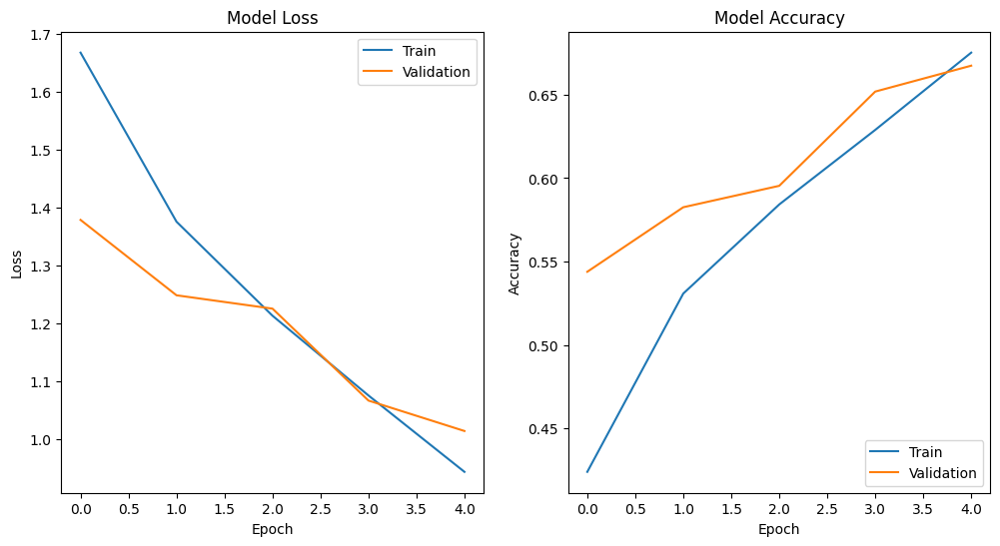

In [ ]:
plot_history(hist)

In [ ]:
# Save the model if needed
model.save('CNN.keras')

### Evaluation

In [ ]:
model.evaluate(validation_generator)

246/246 [==============================] - 17s 68ms/step - loss: 1.0136 - accuracy: 0.6674 - precision_2: 0.7927 - recall_2: 0.5472


[1.013604760169983, 0.6674303412437439, 0.7927346229553223, 0.5471553802490234]

In [ ]:
validation_generator.batch_size = 3000
# validation_generator.batch_size = validation_generator.samples
batchs = next(validation_generator)
images = batchs[0]
preds = model.predict(images)
predicted_classes = np.argmax(preds, axis=1)
true_classes = batchs[1]
true_classes = np.argmax(true_classes, axis=1)

94/94 [==============================] - 2s 23ms/step


In [ ]:
NAMA_KELAS = [key for key, value in validation_generator.class_indices.items()]
INDEKS_KELAS = {value: key for key, value in validation_generator.class_indices.items()}

Accuracy          : 0.6583333333333333
Precision         : 0.6634467869716295
Recall            : 0.6583333333333333
              precision    recall  f1-score   support

        cane       0.60      0.74      0.66       543
     cavallo       0.59      0.64      0.61       285
    elefante       0.77      0.48      0.59       171
    farfalla       0.78      0.71      0.74       257
     gallina       0.83      0.71      0.76       346
       gatto       0.65      0.28      0.39       189
       mucca       0.59      0.50      0.54       210
      pecora       0.51      0.51      0.51       226
       ragno       0.70      0.91      0.79       552
  scoiattolo       0.60      0.47      0.53       221

    accuracy                           0.66      3000
   macro avg       0.66      0.60      0.61      3000
weighted avg       0.66      0.66      0.65      3000

Confusion Matrix : 
[[401  37   4   2  13  14  14  13  31  14]
 [ 47 182   6   4   7   0  16  16   4   3]
 [ 20  19  82   0 

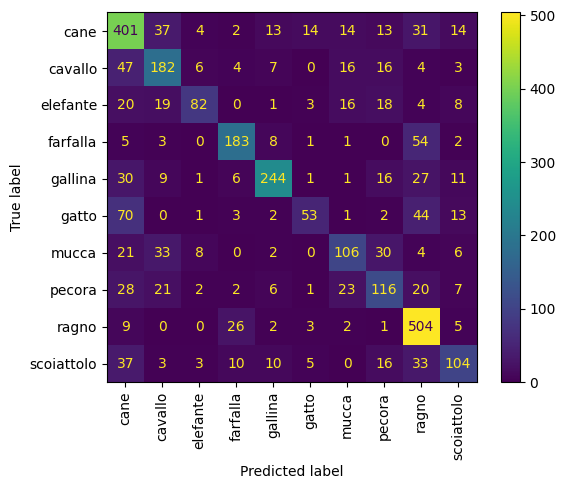

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,\
                            classification_report, confusion_matrix, ConfusionMatrixDisplay

accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average="weighted")
recall = recall_score(true_classes, predicted_classes, average="weighted")
f1 = f1_score(true_classes, predicted_classes, average="weighted")
cr = classification_report(true_classes, predicted_classes, target_names=NAMA_KELAS)

print("Accuracy          : {}".format(accuracy))
print("Precision         : {}".format(precision))
print("Recall            : {}".format(recall))
print(cr)

print(f'Confusion Matrix : \n{confusion_matrix(true_classes, predicted_classes)}')
ConfusionMatrixDisplay.from_predictions(true_classes, predicted_classes, display_labels=NAMA_KELAS, xticks_rotation='vertical')
plt.show()

[1615 1546 1585  540  113 1958 1162  231 1853  970 1825 2719 1223 1051
 2580  912]
(16, 224, 224, 3) (16, 10)
1/1 [==============================] - 0s 302ms/step


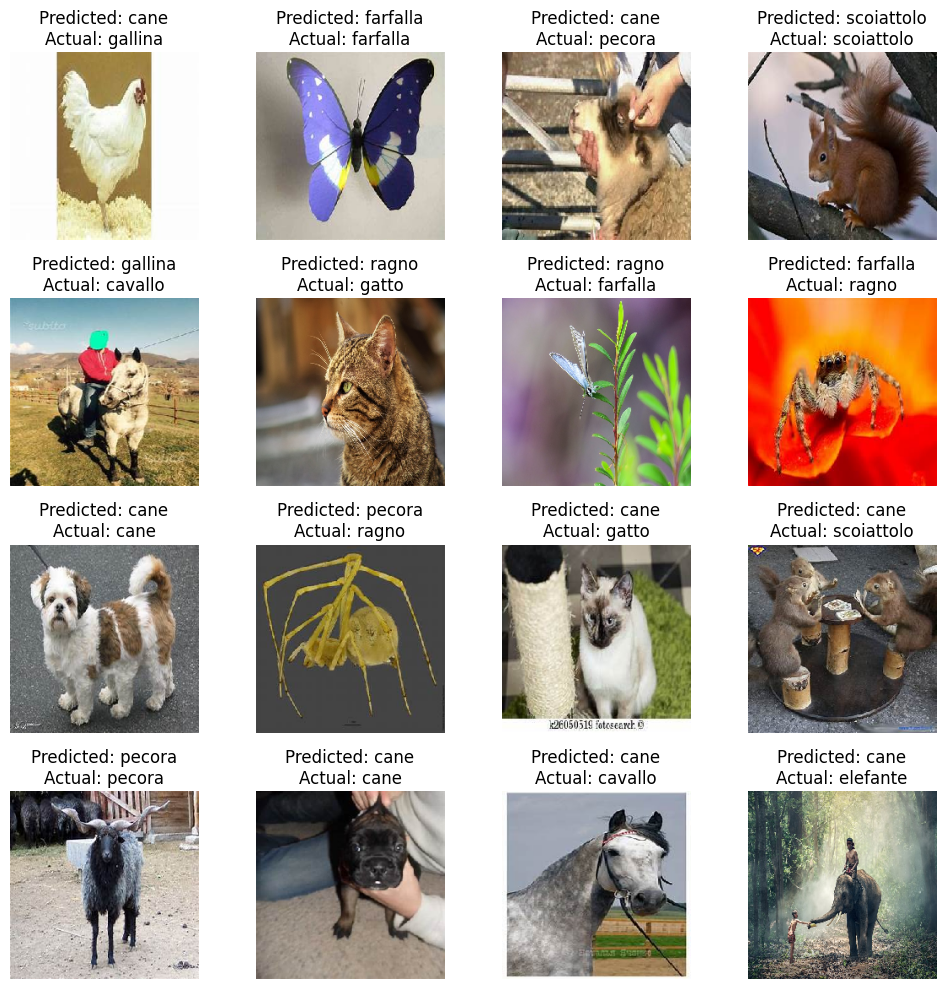

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and their true labels from the generator
# images, true_labels = train_generator.next()
images, true_labels = validation_generator.next()

# take 16 random images
idx = np.random.choice(len(images), size=16, replace=False)
print(idx)
images = images[idx, :]
true_labels = true_labels[idx, :]
print(images.shape, true_labels.shape)

true_labels = np.argmax(true_labels, axis=1)

# Make predictions on the validation generator
predictions = model.predict(images)
predictions = np.argmax(predictions, axis=1)

# Unnormalize the images (if you applied normalization)
# images = np.clip(images*255.0, a_min=0, a_max=255)

# Define a function to display images with their predicted and actual labels
def imshow(img, predicted_label, actual_label):
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}\nActual: {actual_label}')
    plt.axis('off')

# Create a grid for displaying images and their labels
rows, cols = 4, 4
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

# Plot the images with their predicted and actual labels
for i in range(rows * cols):
    # ax = axes[i // cols, i % cols]
    plt.subplot(rows, cols, i+1)
    imshow(images[i], INDEKS_KELAS[predictions[i]], INDEKS_KELAS[true_labels[i]])

plt.tight_layout()
plt.show()

In [ ]:
# Balikin ke nilai batch size sebelumnya
validation_generator.batch_size = 32
validation_generator.batch_size

32

## Convolutional Neural Network + Hyperparameter Tuning

Ref for Pytorch
- https://stackoverflow.com/questions/44260217/hyperparameter-optimization-for-pytorch-model
- https://medium.com/pytorch/accelerate-your-hyperparameter-optimization-with-pytorchs-ecosystem-tools-bc17001b9a49
- https://www.kaggle.com/code/abhishekrathi09/pytorch-basics-part-6-hyperparameter-tuning

In [ ]:
!pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 2.7 MB/s eta 0:00:00


In [ ]:
from tensorflow import keras
from keras_tuner.tuners import BayesianOptimization
import IPython

In [ ]:
## Custom Metric
import keras.backend as K

def get_f1(y_true, y_pred): # taken from old keras source code
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

### Model Definition

#### Short example of defining model with Keras functional method

In [ ]:
input = tf.keras.Input(shape=(224, 224, 3)) # muka orang
input2 = tf.keras.Input(shape=3) # age, height, width
x = Conv2D(100, (3, 3))(input)
y = Conv2D(100, (3, 3))(x)
z = tf.keras.layers.MaxPool2D()(y)
a = tf.keras.layers.Conv2D(200, (3, 3))(z)
b = tf.keras.layers.MaxPool2D()(a)
c = tf.keras.layers.Conv2D(256, (3, 3))(b)
d = tf.keras.layers.MaxPool2D()(c)
flat = tf.keras.layers.Flatten()(d)

y2 = tf.keras.layers.Conv2D(100, (3, 3))(x)
z2 = tf.keras.layers.MaxPool2D()(y2)
a2 = tf.keras.layers.Conv2D(200, (3, 3))(z2)
b2 = tf.keras.layers.MaxPool2D()(a2)
c2 = tf.keras.layers.Conv2D(256, (3, 3))(b2)
d2 = tf.keras.layers.MaxPool2D()(c2)
flat2 = tf.keras.layers.Flatten()(d2)

fc_input2 = Dense(64)(input2)
concat = tf.keras.layers.Concatenate()([flat, flat2, fc_input2])
fc = Dense(10)(concat)
out = Dense(3, activation="softmax")(fc)
out2 = Dense(1)(fc)

model_f = tf.keras.Model(inputs=[input, input2], outputs=[out, out2])

model_f.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_18 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_43 (Conv2D)          (None, 222, 222, 100)        2800      ['input_18[0][0]']            
                                                                                                  
 conv2d_44 (Conv2D)          (None, 220, 220, 100)        90100     ['conv2d_43[0][0]']           
                                                                                                  
 conv2d_47 (Conv2D)          (None, 220, 220, 100)        90100     ['conv2d_43[0][0]']           
                                                                                            

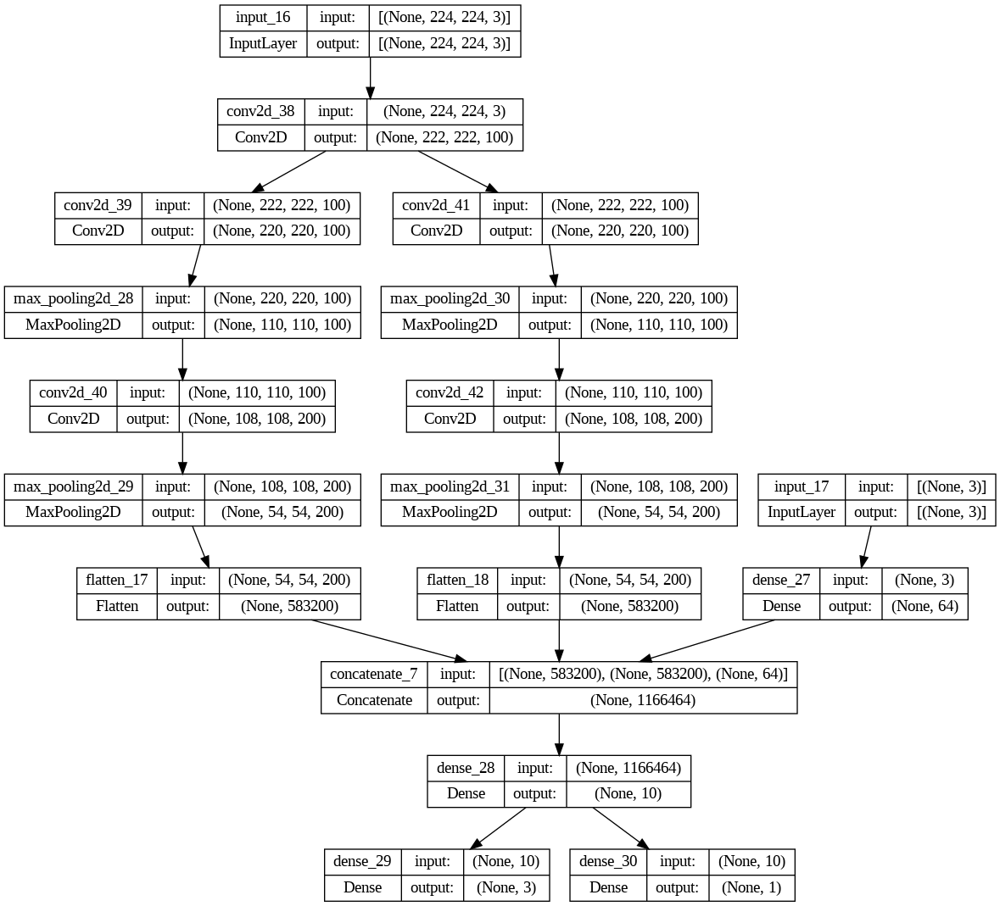

In [ ]:
tf.keras.utils.plot_model(
    model_f,
    to_file="model_f.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    # dpi=200,
    show_layer_activations=False,
    show_trainable=False,
)

In [ ]:
NUM_CLASSES = len(CLASSES)

def build_model(hp):
    input_layer = tf.keras.Input(shape=(224, 224, 3))
    x = Conv2D(32, kernel_size=(3, 3), name="input", activation="relu")(input_layer)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(filters=64, kernel_size=(3, 3), activation="relu")(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(
        filters = hp.Int(
            'filters-Conv-2',
            min_value = 64,
            max_value = 128,
            step = 64
        ),
        kernel_size=(3, 3),
        activation="relu",
        name="Conv-2"
    )(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Conv2D(
        filters = hp.Int(
            'filters-Conv-3',
            min_value = 128,
            max_value = 256,
            step = 128
        ),
        kernel_size = hp.Choice(
            'kernel-Conv-3',
            values = [3, 5]
        ),
        activation="relu",
        name="Conv-3"
    )(x)
    x = MaxPooling2D(pool_size=(2, 2))(x)
    x = Flatten()(x)
    fc = Dense(128, use_bias=True, activation='relu')(x)
    fc = Dropout(0.5)(fc)
    fc = Dense(64, use_bias=True, activation='relu')(fc)
    fc = Dropout(0.5)(fc)
    out = Dense(NUM_CLASSES, activation="softmax", name="output")(fc)
    model = keras.Model(inputs=input_layer, outputs=out)
    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=[
            'accuracy',
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            get_f1
        ]
    )
    return model

In [ ]:
#Hyperparameter tuning
tuner = BayesianOptimization(build_model,
                             objective = 'val_loss',
                             max_trials = 2,
                             directory = '/content/results',
                             project_name = 'Image-Classification-CNN',
                             overwrite = True)

In [ ]:
# Pendefinisian Callback
class ClearTrainingOutput(tf.keras.callbacks.Callback):
    def on_train_end(*args, **kwargs):
        IPython.display.clear_output(wait = True)

early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)

### Fitting or Hyperparameter Search

In [ ]:
tuner.search(train_generator,
             batch_size=32, epochs=2,
             validation_data=validation_generator,
             callbacks=[early_stop, ClearTrainingOutput()])

Trial 2 Complete [00h 03m 46s]
val_loss: 1.8136540651321411

Best val_loss So Far: 1.789823293685913
Total elapsed time: 00h 06m 20s


In [ ]:
# Mendapatkan model terbaik
model = tuner.get_best_models()[0]

### Evaluation

In [ ]:
model.evaluate(validation_generator)

In [ ]:
validation_generator.batch_size = 3000
# validation_generator.batch_size = validation_generator.samples
batchs = next(validation_generator)
images = batchs[0]
preds = model.predict(images)
predicted_classes = np.argmax(preds, axis=1)
true_classes = batchs[1]
true_classes = np.argmax(true_classes, axis=1)

In [ ]:
NAMA_KELAS = [key for key, value in validation_generator.class_indices.items()]
INDEKS_KELAS = {value: key for key, value in validation_generator.class_indices.items()}

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,\
                            classification_report, confusion_matrix, ConfusionMatrixDisplay

accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average="weighted")
recall = recall_score(true_classes, predicted_classes, average="weighted")
f1 = f1_score(true_classes, predicted_classes, average="weighted")
cr = classification_report(true_classes, predicted_classes, target_names=NAMA_KELAS)

print("Accuracy          : {}".format(accuracy))
print("Precision         : {}".format(precision))
print("Recall            : {}".format(recall))
print(cr)

print(f'Confusion Matrix : \n{confusion_matrix(true_classes, predicted_classes)}')
ConfusionMatrixDisplay.from_predictions(true_classes, predicted_classes, display_labels=NAMA_KELAS, xticks_rotation='vertical')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and their true labels from the generator
# images, true_labels = train_generator.next()
images, true_labels = validation_generator.next()

# take 16 random images
idx = np.random.choice(len(images), size=16, replace=False)
print(idx)
images = images[idx, :]
true_labels = true_labels[idx, :]
print(images.shape, true_labels.shape)

true_labels = np.argmax(true_labels, axis=1)

# Make predictions on the validation generator
predictions = model.predict(images)
predictions = np.argmax(predictions, axis=1)

# Unnormalize the images (if you applied normalization)
# images = np.clip(images*255.0, a_min=0, a_max=255)

# Define a function to display images with their predicted and actual labels
def imshow(img, predicted_label, actual_label):
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}\nActual: {actual_label}')
    plt.axis('off')

# Create a grid for displaying images and their labels
rows, cols = 4, 4
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

# Plot the images with their predicted and actual labels
for i in range(rows * cols):
    # ax = axes[i // cols, i % cols]
    plt.subplot(rows, cols, i+1)
    imshow(images[i], INDEKS_KELAS[predictions[i]], INDEKS_KELAS[true_labels[i]])

plt.tight_layout()
plt.show()

## Convolutional Neural Network + Transfer Learning

### Model Definition

In [ ]:
from tensorflow.keras.applications import VGG16, ResNet50

In [ ]:
NUM_CLASSES = len(CLASSES)

def build_model_tf():
    # input_layer = tf.keras.Input(shape=(224, 224, 3))
    # x = Conv2D(32, kernel_size=(3, 3), name="input", activation="relu")(input_layer)
    # x = MaxPooling2D(pool_size=(2, 2))(x)
    # x = Conv2D(64, kernel_size=(3, 3), activation="relu")(x)
    # x = MaxPooling2D(pool_size=(2, 2))(x)
    # x = Conv2D(filters = 128, kernel_size=(3, 3), activation="relu", name="Conv-2")
    # x = MaxPooling2D(pool_size=(2, 2))
    # x = Conv2D(filters = 256,kernel_size = (3, 3),activation="relu",name="Conv-3")
    # x = MaxPooling2D(pool_size=(2, 2))

    pretrained_model = tf.keras.applications.ResNet50(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3),
    )
    for layer in pretrained_model.layers[:]:
        layer.trainable = False

    x = Flatten()(pretrained_model.output)
    fc = Dense(128, use_bias=True, activation='relu')(x)
    fc = Dropout(0.5)(fc)
    fc = Dense(64, use_bias=True, activation='relu')(fc)
    fc = Dropout(0.5)(fc)
    out = Dense(NUM_CLASSES, activation="softmax", name="output")(fc)
    model = keras.Model(inputs=pretrained_model.inputs, outputs=out)
    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=[
            'accuracy',
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            get_f1
        ]
    )
    return model

In [ ]:
model_tf = build_model_tf()

94765736/94765736 [==============================] - 1s 0us/step


In [ ]:
model_tf.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_3[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

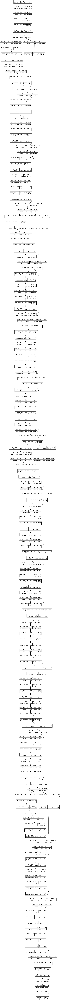

In [ ]:
tf.keras.utils.plot_model(
    model_tf,
    to_file="model_tf.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    # dpi=200,
    show_layer_activations=False,
    show_trainable=False,
)

### Fitting

In [ ]:
# Train the model
hist = model_tf.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=3,
)

Epoch 1/3
573/573 [==============================] - 121s 197ms/step - loss: 2.3323 - accuracy: 0.1820 - precision: 0.1027 - recall: 0.0013 - get_f1: 0.0016 - val_loss: 2.2122 - val_accuracy: 0.1842 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_get_f1: 0.0000e+00
Epoch 2/3
573/573 [==============================] - 106s 185ms/step - loss: 2.2150 - accuracy: 0.1850 - precision: 0.0000e+00 - recall: 0.0000e+00 - get_f1: 0.0000e+00 - val_loss: 2.2081 - val_accuracy: 0.1842 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_get_f1: 0.0000e+00
Epoch 3/3
573/573 [==============================] - 109s 191ms/step - loss: 2.2138 - accuracy: 0.1841 - precision: 0.0714 - recall: 5.4579e-05 - get_f1: 7.5878e-05 - val_loss: 2.2077 - val_accuracy: 0.1857 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_get_f1: 0.0000e+00


### Training History

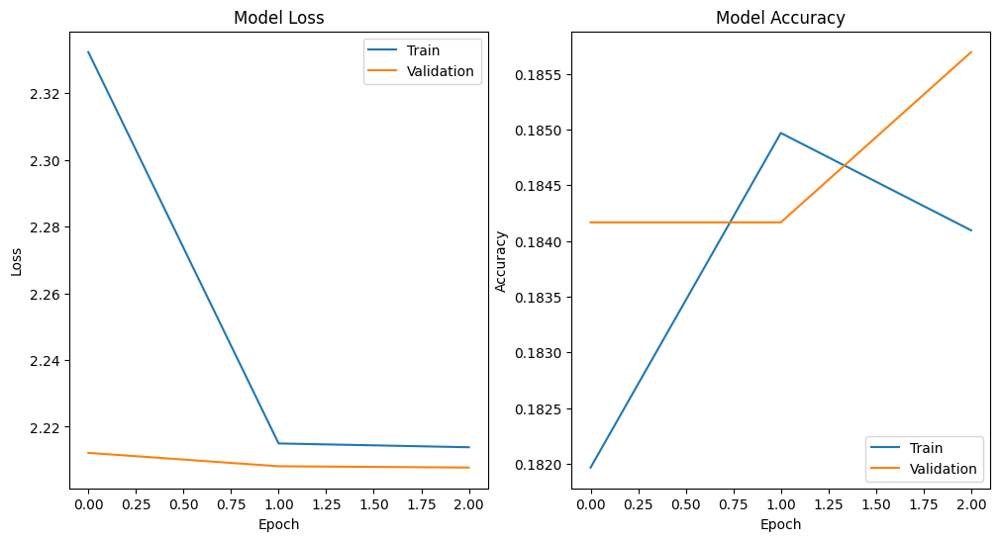

In [ ]:
plot_history(hist)

In [ ]:
# Save the model if needed
model.save('CNN-TF.keras')

### Evaluation

In [ ]:
model.evaluate(validation_generator)

246/246 [==============================] - 21s 85ms/step - loss: 1.7898 - accuracy: 0.3624 - precision: 0.7304 - recall: 0.1089 - get_f1: 0.1857


[1.7898235321044922,
 0.36235204339027405,
 0.7303754091262817,
 0.10894743353128433,
 0.1857120841741562]

In [ ]:
validation_generator.batch_size = 3000
# validation_generator.batch_size = validation_generator.samples
batchs = next(validation_generator)
images = batchs[0]
preds = model.predict(images)
predicted_classes = np.argmax(preds, axis=1)
true_classes = batchs[1]
true_classes = np.argmax(true_classes, axis=1)

59/59 [==============================] - 1s 21ms/step


In [ ]:
NAMA_KELAS = [key for key, value in validation_generator.class_indices.items()]
INDEKS_KELAS = {value: key for key, value in validation_generator.class_indices.items()}

Accuracy          : 0.37856758212170166
Precision         : 0.29658718836125514
Recall            : 0.37856758212170166
              precision    recall  f1-score   support

        cane       0.27      0.82      0.40       345
     cavallo       0.38      0.11      0.17       170
    elefante       0.00      0.00      0.00        93
    farfalla       0.61      0.53      0.57       144
     gallina       0.49      0.22      0.31       228
       gatto       0.00      0.00      0.00       132
       mucca       0.00      0.00      0.00       130
      pecora       0.00      0.00      0.00       120
       ragno       0.54      0.76      0.63       362
  scoiattolo       0.00      0.00      0.00       133

    accuracy                           0.38      1857
   macro avg       0.23      0.24      0.21      1857
weighted avg       0.30      0.38      0.29      1857

Confusion Matrix : 
[[284   4   0   1   9   0   0   0  47   0]
 [125  18   0   2  11   0   0   0  14   0]
 [ 75   6   0  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

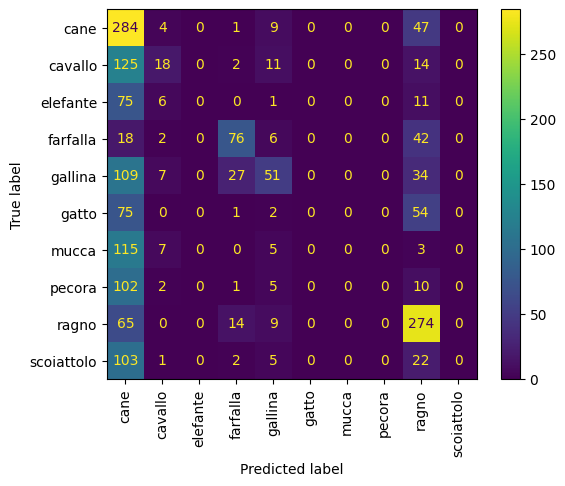

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,\
                            classification_report, confusion_matrix, ConfusionMatrixDisplay

accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average="weighted")
recall = recall_score(true_classes, predicted_classes, average="weighted")
f1 = f1_score(true_classes, predicted_classes, average="weighted")
cr = classification_report(true_classes, predicted_classes, target_names=NAMA_KELAS)

print("Accuracy          : {}".format(accuracy))
print("Precision         : {}".format(precision))
print("Recall            : {}".format(recall))
print(cr)

print(f'Confusion Matrix : \n{confusion_matrix(true_classes, predicted_classes)}')
ConfusionMatrixDisplay.from_predictions(true_classes, predicted_classes, display_labels=NAMA_KELAS, xticks_rotation='vertical')
plt.show()

[2790 2304  100 1241 1959 1645  789  105 2335  872  669 1288    4 1208
 1139 2569]
(16, 224, 224, 3) (16, 10)
1/1 [==============================] - 0s 24ms/step


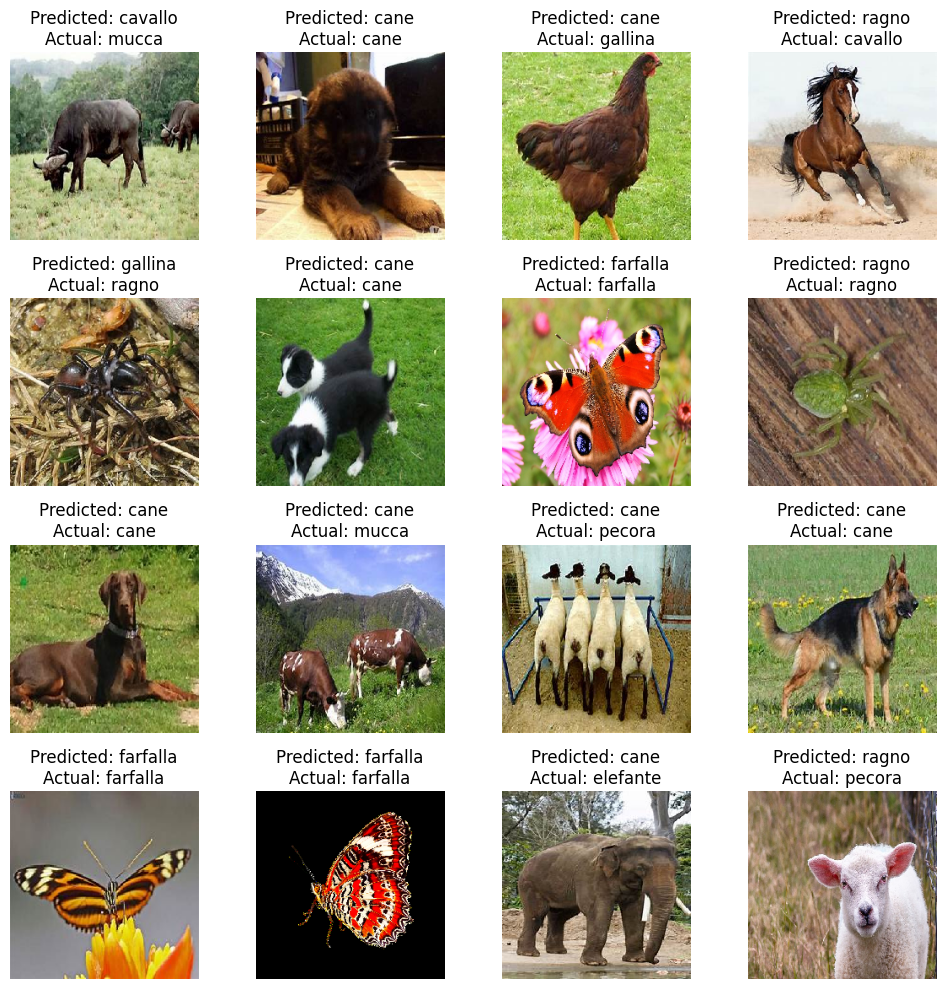

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and their true labels from the generator
# images, true_labels = train_generator.next()
images, true_labels = validation_generator.next()

# take 16 random images
idx = np.random.choice(len(images), size=16, replace=False)
print(idx)
images = images[idx, :]
true_labels = true_labels[idx, :]
print(images.shape, true_labels.shape)

true_labels = np.argmax(true_labels, axis=1)

# Make predictions on the validation generator
predictions = model.predict(images)
predictions = np.argmax(predictions, axis=1)

# Unnormalize the images (if you applied normalization)
# images = np.clip(images*255.0, a_min=0, a_max=255)

# Define a function to display images with their predicted and actual labels
def imshow(img, predicted_label, actual_label):
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}\nActual: {actual_label}')
    plt.axis('off')

# Create a grid for displaying images and their labels
rows, cols = 4, 4
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

# Plot the images with their predicted and actual labels
for i in range(rows * cols):
    # ax = axes[i // cols, i % cols]
    plt.subplot(rows, cols, i+1)
    imshow(images[i], INDEKS_KELAS[predictions[i]], INDEKS_KELAS[true_labels[i]])

plt.tight_layout()
plt.show()

In [ ]:
# Balikin ke nilai batch size sebelumnya
validation_generator.batch_size = 32
validation_generator.batch_size

32

## Convolutional Neural Network + Transfer Learning + Fine-Tuning + Data Augmentation

### Data Augmentation

In [ ]:
# Define data directories
train_data_dir = '/content/datasets/raw-img/train'
validation_data_dir = '/content/datasets/raw-img/test'

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1.0/255,  # Normalize pixel values to [0, 1]
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)

validation_datagen = ImageDataGenerator(rescale=1.0/255)

validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    # shuffle=False  # NO NEED I GUESS
)

Found 18322 images belonging to 10 classes.
Found 7857 images belonging to 10 classes.


### Model Definition

In [ ]:
from tensorflow.keras.applications import VGG16, ResNet50

In [ ]:
NUM_CLASSES = len(CLASSES)

def build_model_tf():
    pretrained_model = tf.keras.applications.ResNet50(
        include_top=False,
        weights="imagenet",
        input_shape=(224, 224, 3),
    )
    total_layers = len(pretrained_model.layers)
    trainable_layers_ratio = total_layers//10
    for layer in pretrained_model.layers[:]:
        layer.trainable = False

    # for layer in pretrained_model.layers[:-total_layers//10]:
    #     layer.trainable = False

    # for layer in pretrained_model.layers[-total_layers//10:]:
    #     layer.trainable = True

    x = Flatten()(pretrained_model.output)
    fc = Dense(128, use_bias=True, activation='relu')(x)
    fc = Dropout(0.5)(fc)
    fc = Dense(64, use_bias=True, activation='relu')(fc)
    fc = Dropout(0.5)(fc)
    out = Dense(NUM_CLASSES, activation="softmax", name="output")(fc)
    model = keras.Model(inputs=pretrained_model.inputs, outputs=out)
    model.compile(
        loss='categorical_crossentropy',
        optimizer='adam',
        metrics=[
            'accuracy',
            tf.keras.metrics.Precision(name="precision"),
            tf.keras.metrics.Recall(name="recall"),
            get_f1
        ]
    )
    return model

In [ ]:
model_tf = build_model_tf()

In [ ]:
model_tf.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_5[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

### Fitting

In [ ]:
# Train the model
hist = model_tf.fit(
    train_generator,
    validation_data=validation_generator,
    epochs=2,
)

Epoch 1/2
573/573 [==============================] - 302s 518ms/step - loss: 2.4112 - accuracy: 0.1848 - precision: 0.0685 - recall: 0.0014 - get_f1: 0.0017 - val_loss: 2.2112 - val_accuracy: 0.1842 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_get_f1: 0.0000e+00
Epoch 2/2
573/573 [==============================] - 300s 523ms/step - loss: 2.2403 - accuracy: 0.1837 - precision: 0.1967 - recall: 6.5495e-04 - get_f1: 8.8261e-04 - val_loss: 2.2080 - val_accuracy: 0.1842 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - val_get_f1: 0.0000e+00


### Training History

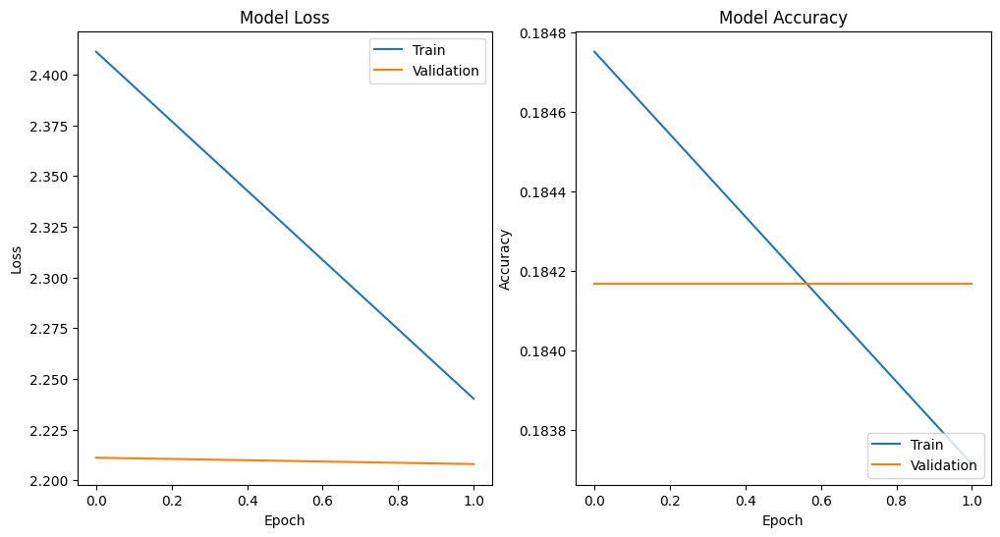

In [ ]:
plot_history(hist)

In [ ]:
# Save the model if needed
model.save('CNN-TF.keras')

### Evaluation

In [ ]:
model.evaluate(validation_generator)

246/246 [==============================] - 16s 66ms/step - loss: 1.7898 - accuracy: 0.3624 - precision: 0.7304 - recall: 0.1089 - get_f1: 0.1863


[1.7898235321044922,
 0.36235204339027405,
 0.7303754091262817,
 0.10894743353128433,
 0.1863129436969757]

In [ ]:
validation_generator.batch_size = 3000
# validation_generator.batch_size = validation_generator.samples
batchs = next(validation_generator)
images = batchs[0]
preds = model.predict(images)
predicted_classes = np.argmax(preds, axis=1)
true_classes = batchs[1]
true_classes = np.argmax(true_classes, axis=1)

94/94 [==============================] - 2s 19ms/step


In [ ]:
NAMA_KELAS = [key for key, value in validation_generator.class_indices.items()]
INDEKS_KELAS = {value: key for key, value in validation_generator.class_indices.items()}

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:13

Accuracy          : 0.36866666666666664
Precision         : 0.2745905788955461
Recall            : 0.36866666666666664
              precision    recall  f1-score   support

        cane       0.27      0.79      0.40       581
     cavallo       0.33      0.09      0.14       302
    elefante       0.00      0.00      0.00       156
    farfalla       0.61      0.58      0.60       233
     gallina       0.43      0.21      0.28       346
       gatto       0.00      0.00      0.00       215
       mucca       0.00      0.00      0.00       225
      pecora       0.00      0.00      0.00       193
       ragno       0.51      0.76      0.61       545
  scoiattolo       0.00      0.00      0.00       204

    accuracy                           0.37      3000
   macro avg       0.21      0.24      0.20      3000
weighted avg       0.27      0.37      0.28      3000

Confusion Matrix : 
[[459   7   0   7  10   0   0   0  98   0]
 [230  28   0   2  21   0   0   0  21   0]
 [124  10   0   

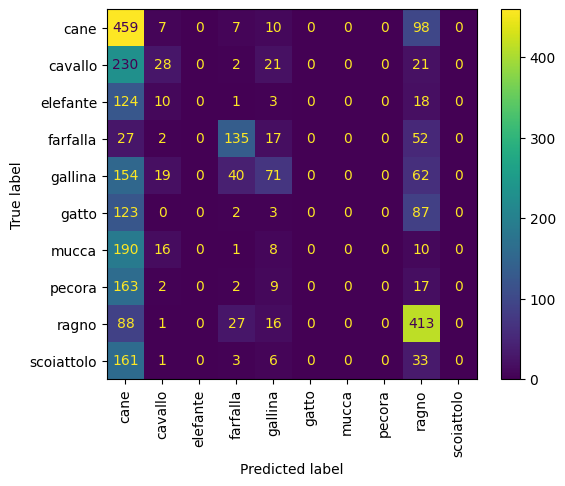

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,\
                            classification_report, confusion_matrix, ConfusionMatrixDisplay

accuracy = accuracy_score(true_classes, predicted_classes)
precision = precision_score(true_classes, predicted_classes, average="weighted")
recall = recall_score(true_classes, predicted_classes, average="weighted")
f1 = f1_score(true_classes, predicted_classes, average="weighted")
cr = classification_report(true_classes, predicted_classes, target_names=NAMA_KELAS)

print("Accuracy          : {}".format(accuracy))
print("Precision         : {}".format(precision))
print("Recall            : {}".format(recall))
print(cr)

print(f'Confusion Matrix : \n{confusion_matrix(true_classes, predicted_classes)}')
ConfusionMatrixDisplay.from_predictions(true_classes, predicted_classes, display_labels=NAMA_KELAS, xticks_rotation='vertical')
plt.show()

[2248 2541 1406 1691 1536 1350  963 1394  107  297 1630 2684 1215  618
 2995  780]
(16, 224, 224, 3) (16, 10)
1/1 [==============================] - 0s 24ms/step


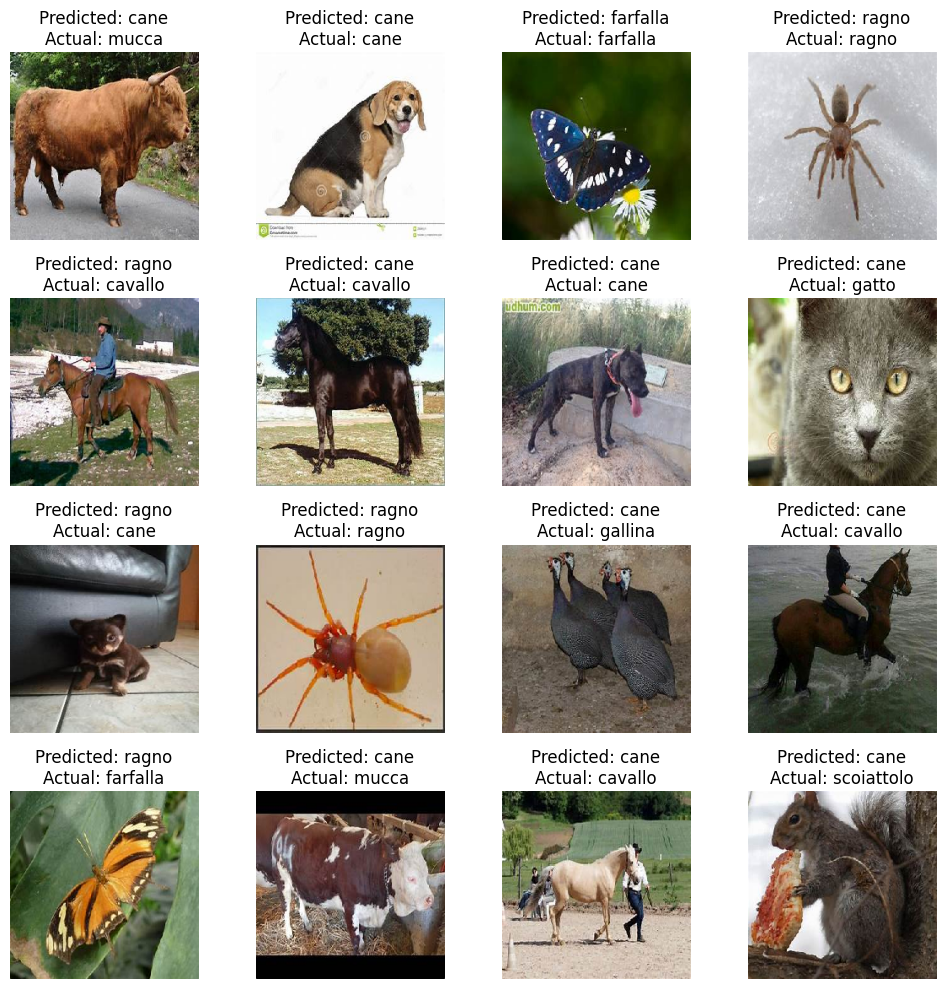

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get a batch of images and their true labels from the generator
# images, true_labels = train_generator.next()
images, true_labels = validation_generator.next()

# take 16 random images
idx = np.random.choice(len(images), size=16, replace=False)
print(idx)
images = images[idx, :]
true_labels = true_labels[idx, :]
print(images.shape, true_labels.shape)

true_labels = np.argmax(true_labels, axis=1)

# Make predictions on the validation generator
predictions = model.predict(images)
predictions = np.argmax(predictions, axis=1)

# Unnormalize the images (if you applied normalization)
# images = np.clip(images*255.0, a_min=0, a_max=255)

# Define a function to display images with their predicted and actual labels
def imshow(img, predicted_label, actual_label):
    plt.imshow(img)
    plt.title(f'Predicted: {predicted_label}\nActual: {actual_label}')
    plt.axis('off')

# Create a grid for displaying images and their labels
rows, cols = 4, 4
fig, axes = plt.subplots(rows, cols, figsize=(10, 10))

# Plot the images with their predicted and actual labels
for i in range(rows * cols):
    # ax = axes[i // cols, i % cols]
    plt.subplot(rows, cols, i+1)
    imshow(images[i], INDEKS_KELAS[predictions[i]], INDEKS_KELAS[true_labels[i]])

plt.tight_layout()
plt.show()

In [ ]:
# Balikin ke nilai batch size sebelumnya
validation_generator.batch_size = 32
validation_generator.batch_size

32